<a href="https://colab.research.google.com/github/eweiwei/Satellite-Image-Classification/blob/main/Satellite_Image_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import os
import zipfile

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import tensorflow as tf
import tensorflow_datasets as tfds
from IPython.display import Image, display

from sklearn.metrics import f1_score, precision_score, recall_score, confusion_matrix, ConfusionMatrixDisplay

from tensorflow import keras
from tensorflow.keras import datasets, layers, models, applications, utils, preprocessing, callbacks
from tensorflow.keras.preprocessing.image import img_to_array, load_img
from tensorflow.keras.callbacks import ModelCheckpoint

In [ ]:
# load entire dataset and split into training, testing and validation sets
(ds_train, ds_val, test_ds) = tfds.load('eurosat',
                                        split=['train[:80%]', 'train[80%:90%]', 'train[90%:]'],
)

Dl Completed...: 0 url [00:00, ? url/s]

Dl Size...: 0 MiB [00:00, ? MiB/s]

Extraction completed...: 0 file [00:00, ? file/s]

Generating splits...:   0%|          | 0/1 [00:00<?, ? splits/s]

Generating train examples...:   0%|          | 0/27000 [00:00<?, ? examples/s]

Shuffling /root/tensorflow_datasets/eurosat/rgb/2.0.0.incompleteSQE544/eurosat-train.tfrecord*...:   0%|      …

Dataset eurosat downloaded and prepared to /root/tensorflow_datasets/eurosat/rgb/2.0.0. Subsequent calls will reuse this data.


In [ ]:
# find 10 class names included in dataset
class_names = metadata.features['label'].names
class_names
# DONT RUN

['AnnualCrop',
 'Forest',
 'HerbaceousVegetation',
 'Highway',
 'Industrial',
 'Pasture',
 'PermanentCrop',
 'Residential',
 'River',
 'SeaLake']

In [ ]:
batch_size = 64

In [ ]:
# preprocessing dataset to prepare for training
def configure_for_performance(ds):
  ds = ds.cache()
  ds = ds.map(lambda d: (d["image"], tf.one_hot(d["label"], 10)))
  ds = ds.shuffle(buffer_size=1000)
  ds = ds.repeat()
  ds = ds.batch(batch_size)
  ds = ds.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)
  return ds

In [ ]:
# preprocess training & validation sets but not testing; need testing set as is to analyze performance
train_ds = configure_for_performance(ds_train)
val_ds = configure_for_performance(ds_val)

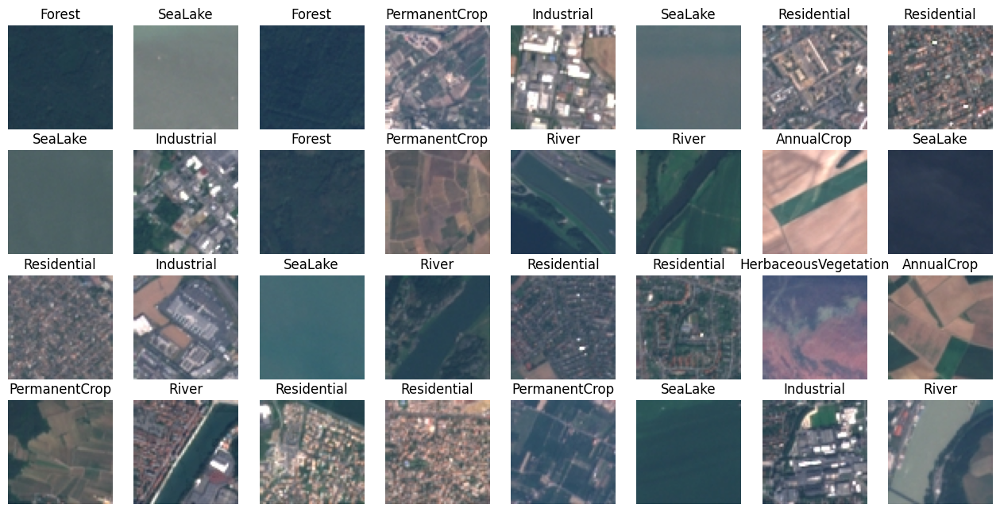

In [ ]:
batch = next(iter(train_ds))

plt.figure(figsize=(16, 16))
for n in range(min(32, batch_size)):
    ax = plt.subplot(batch_size//8, 8, n + 1)
    plt.imshow(batch[0][n])
    plt.title(class_names[tf.argmax(batch[1][n].numpy())])
    plt.axis('off')

In [ ]:
# shape and contents of each batch in the training set
for b in batch:
  print(b)

tf.Tensor(
[[[[ 21  42  69]
   [ 21  42  69]
   [ 23  43  70]
   ...
   [ 23  44  73]
   [ 20  44  70]
   [ 20  44  70]]

  [[ 21  42  69]
   [ 22  43  70]
   [ 22  42  69]
   ...
   [ 23  44  71]
   [ 20  44  70]
   [ 21  45  71]]

  [[ 21  45  69]
   [ 20  44  68]
   [ 23  44  71]
   ...
   [ 20  44  70]
   [ 21  45  71]
   [ 21  45  73]]

  ...

  [[ 20  44  68]
   [ 20  44  68]
   [ 23  44  71]
   ...
   [ 21  45  71]
   [ 21  45  73]
   [ 20  44  72]]

  [[ 22  43  70]
   [ 22  43  70]
   [ 24  43  73]
   ...
   [ 21  42  69]
   [ 21  42  71]
   [ 21  42  71]]

  [[ 22  43  70]
   [ 21  42  69]
   [ 22  41  71]
   ...
   [ 21  42  69]
   [ 23  42  72]
   [ 24  43  73]]]


 [[[ 82  91 100]
   [ 83  90 100]
   [ 89  93 104]
   ...
   [ 64  80  93]
   [ 91  98 116]
   [102 107 126]]

  [[ 81  90  99]
   [ 83  90 100]
   [ 88  90 102]
   ...
   [ 68  82  95]
   [ 89  98 113]
   [103 110 126]]

  [[ 85  92 100]
   [ 84  91  99]
   [ 89  91 103]
   ...
   [ 60  72  84]
   [ 63  75  87]


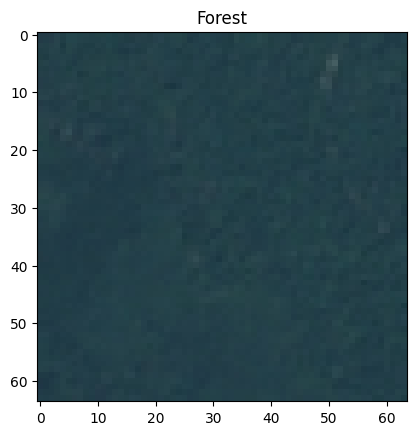

In [ ]:
get_label_name = metadata.features['label'].int2str

image, label = next(iter(ds_train))
_ = plt.imshow(image)
_ = plt.title(get_label_name(label))

In [ ]:
# function that analyzes model by calculating accuracy metrics and creating confusion matrix
def analyze(model, file):
  model.load_weights(file)

  images = np.array([ d["image"] for d in test_ds.take(5400) ])
  labels = np.array([ d["label"] for d in test_ds.take(5400) ])

  predictions = model.predict(images)
  predictions = np.argmax(predictions, axis=1)
  print("predictions.shape:", predictions.shape)

  cm = confusion_matrix(labels, predictions)
  cm = cm.astype('float') / cm.sum(axis=0)[:, np.newaxis]
  cm_display = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = [f"true_{c}" for c in class_names])
  fig, ax = plt.subplots(figsize=(10, 10))

  cm_display.plot(cmap='RdPu', ax=ax, include_values=True, values_format ='.2f')
  cm_display.ax_.set(xlabel='Predicted', ylabel='True')
  cm_display.ax_.set_xticklabels([f"pred_{c}" for c in class_names], rotation=90)

  accuracy = tf.keras.metrics.Accuracy()
  accuracy.update_state(labels, predictions)
  print("Accuracy:", accuracy.result().numpy())
  print("Precision:", precision_score(labels, predictions, average="macro"))
  print("Recall:", recall_score(labels, predictions, average="macro"))
  print("F1 Score:", f1_score(labels, predictions, average="macro"))

IMPROVED MODEL

In [ ]:
# self-built neural network with input image shape as (64, 64, 3)
model = keras.Sequential([
    layers.Conv2D(32, (3, 3), activation='relu', input_shape=(64, 64, 3)),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(64, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),
    layers.Conv2D(128, (3, 3), activation='relu'),
    layers.BatchNormalization(),
    layers.MaxPooling2D(2, 2),
    layers.Flatten(),
    layers.Dense(512, activation='relu'),
    layers.BatchNormalization(),
    layers.Dropout(0.5),
    layers.Dense(10, activation='softmax')
])

In [ ]:
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_4 (Conv2D)           (None, 62, 62, 32)        896       
                                                                 
 batch_normalization_5 (Bat  (None, 62, 62, 32)        128       
 chNormalization)                                                
                                                                 
 max_pooling2d_4 (MaxPoolin  (None, 31, 31, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_5 (Conv2D)           (None, 29, 29, 64)        18496     
                                                                 
 batch_normalization_6 (Bat  (None, 29, 29, 64)        256       
 chNormalization)                                                
                                                      

In [ ]:
# exponential learning rate schedule that allows for fine-tuning towards end of learning process
lr_schedule = keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=1e-3,
    decay_steps=1000,
    decay_rate=0.9
)

In [ ]:
# include model checkpoint to avoid overfitting and save model after reaching highest accuracy
model.compile(
    optimizer=keras.optimizers.Adam(learning_rate=lr_schedule),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

checkpoint_callback = ModelCheckpoint("more_improved_best_model.keras", save_best_only=True, monitor="val_loss", mode="min", save_weights_only=True)

In [ ]:
history = model.fit(
    train_ds,
    validation_data = val_ds,
    epochs=30,
    callbacks=[checkpoint_callback],
    steps_per_epoch=253,
    validation_steps=84
)

Epoch 1/30
253/253 [==============================] - 183s 716ms/step - loss: 0.6109 - accuracy: 0.7931 - val_loss: 6.0399 - val_accuracy: 0.3943
Epoch 2/30
253/253 [==============================] - 173s 684ms/step - loss: 0.4947 - accuracy: 0.8326 - val_loss: 0.8345 - val_accuracy: 0.7260
Epoch 3/30
253/253 [==============================] - 183s 723ms/step - loss: 0.4004 - accuracy: 0.8653 - val_loss: 1.1283 - val_accuracy: 0.7225
Epoch 4/30
253/253 [==============================] - 173s 682ms/step - loss: 0.3679 - accuracy: 0.8768 - val_loss: 1.9071 - val_accuracy: 0.5009
Epoch 5/30
253/253 [==============================] - 164s 649ms/step - loss: 0.3101 - accuracy: 0.8954 - val_loss: 0.6559 - val_accuracy: 0.7753
Epoch 6/30
253/253 [==============================] - 174s 687ms/step - loss: 0.2801 - accuracy: 0.9043 - val_loss: 2.3470 - val_accuracy: 0.5145
Epoch 7/30
253/253 [==============================] - 176s 695ms/step - loss: 0.2370 - accuracy: 0.9179 - val_loss: 0.3694 -

85/85 [==============================] - 10s 111ms/step
predictions.shape: (2700,)
Accuracy: 0.91074073
Precision: 0.912825851061916
Recall: 0.9057945475351998
F1 Score: 0.9074631972651336


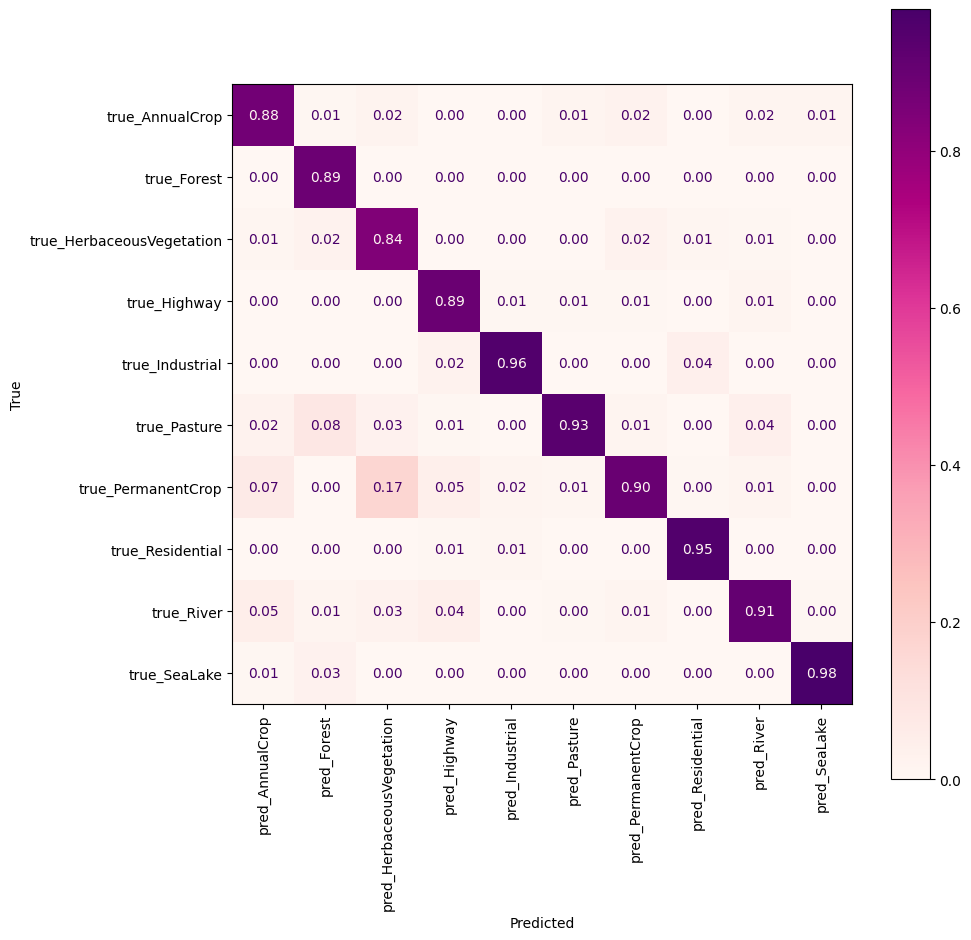

In [ ]:
analyze(model, '/content/more_improved_best_model.keras')

In [ ]:
model.load_weights('/content/more_improved_best_model.keras')

In [ ]:
# Extract and load in files
zip_file_name = 'zipped.zip'

extract_path = '/content'

os.makedirs(extract_path, exist_ok=True)

with zipfile.ZipFile(zip_file_name, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

os.listdir(extract_path)

['.config',
 'zipped.zip',
 'satellite-image-example.png',
 'more_improved_best_model.keras',
 '.ipynb_checkpoints',
 'images',
 'sample_data']

In [ ]:

# SCreate a DataFrame with image filenames and years
image_folder_path = '/content/images/'
image_files = [f for f in os.listdir(image_folder_path) if os.path.isfile(os.path.join(image_folder_path, f))]

image_data = pd.DataFrame(columns=['image', 'year'])

for image_file in image_files:
    year = os.path.splitext(image_file)[0]
    image_data = image_data.append({'image': os.path.join(image_folder_path, image_file), 'year': int(year)}, ignore_index=True)

image_data = image_data.sort_values(by='year').reset_index(drop=True)
image_data = image_data.iloc[1: , :].reset_index(drop=True)

In [ ]:
image_data

,image,year
0,/content/images/1985.png,1985
1,/content/images/1987.png,1987
2,/content/images/1989.png,1989
3,/content/images/1991.png,1991
4,/content/images/1993.png,1993
5,/content/images/1995.png,1995
6,/content/images/1997.png,1997
7,/content/images/1999.png,1999
8,/content/images/2001.png,2001
9,/content/images/2003.png,2003


In [ ]:
def predict_classification(img):
    image = load_img(img, target_size=(64, 64))
    image = img_to_array(image)
    image = np.reshape(image, [1, 64, 64, 3])
    return class_names[np.argmax(model.predict(image), axis=1)[0]]

# Add classification results to the DataFrame
image_data['classification'] = image_data['image'].apply(predict_classification)

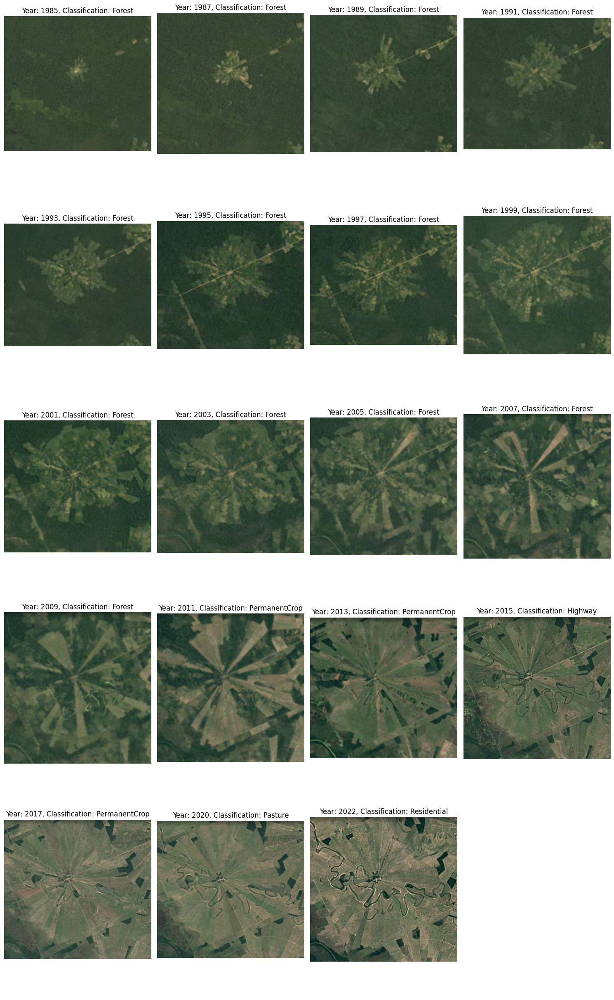

In [ ]:
num_columns = 4
num_rows = (len(image_data) + num_columns - 1) // num_columns

fig, axs = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))

for index, row in image_data.iterrows():
    img = mpimg.imread(row['image'])
    axs[index // num_columns, index % num_columns].imshow(img)
    axs[index // num_columns, index % num_columns].axis('off')
    axs[index // num_columns, index % num_columns].set_title(f"Year: {row['year']}, Classification: {row['classification']}")

for index in range(len(image_data), num_rows * num_columns):
    axs[index // num_columns, index % num_columns].axis('off')

plt.tight_layout()
plt.show()

Classification of a single plot of land in San Julian, Bolivia over time: The classifier slowly deviates from the 'Forest' classification as forest land gets converted to land for soybean farming. The classifier incorrectly classifies the land as 'Residential' and 'Highway' at times, which is expected from a 90% accurate classifier. The main takeaway should be the fact that this plot of land has been transformed to the point where it's unrecognizable to our classifier.

In [ ]:
# Specify the name of the uploaded zip file
zip_file_name = 'china.zip'

# Specify the extraction path
extract_path = '/content/china'

# Create the extraction directory if it doesn't exist
os.makedirs(extract_path, exist_ok=True)

# Unzip the file
with zipfile.ZipFile(zip_file_name, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

# List the contents of the extracted folder
os.listdir(extract_path)

['china']

In [ ]:
# Step 1: Create a DataFrame with image filenames and years
image_folder_path = '/content/china/china'
image_files = [f for f in os.listdir(image_folder_path) if os.path.isfile(os.path.join(image_folder_path, f))]

image_data = pd.DataFrame(columns=['image', 'year'])

for image_file in image_files:
    year = os.path.splitext(image_file)[0]
    image_data = image_data.append({'image': os.path.join(image_folder_path, image_file), 'year': int(year)}, ignore_index=True)

# Step 2: Sort the DataFrame based on the 'year' column
image_data = image_data.sort_values(by='year').reset_index(drop=True)
image_data = image_data.iloc[1: , :].reset_index(drop=True)

In [ ]:
# Step 3: Add classification results to the DataFrame
image_data['classification'] = image_data['image'].apply(predict_classification)

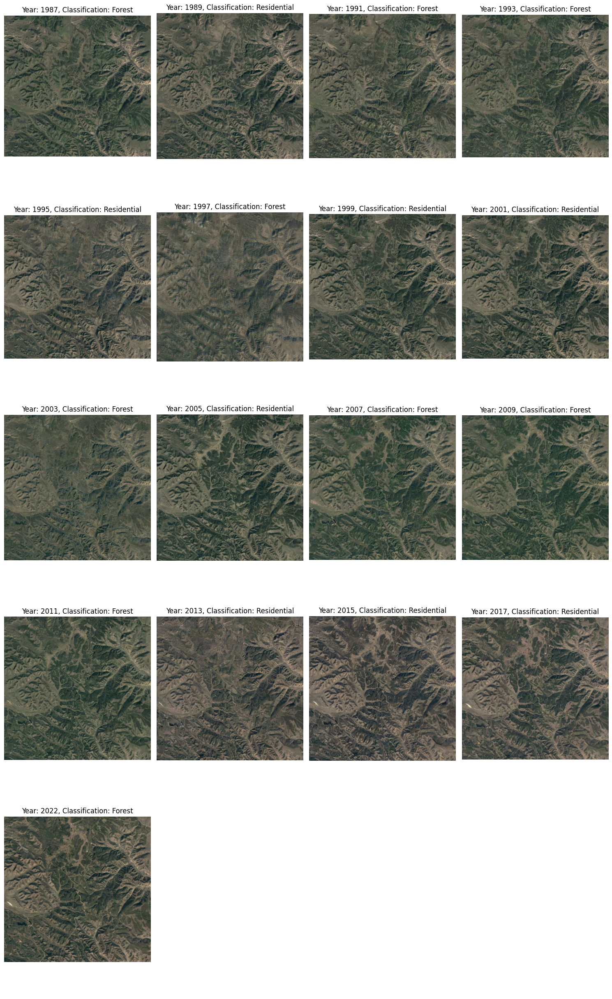

In [ ]:
num_columns = 4
num_rows = (len(image_data) + num_columns - 1) // num_columns

fig, axs = plt.subplots(num_rows, num_columns, figsize=(15, 5 * num_rows))

for index, row in image_data.iterrows():
    img = mpimg.imread(row['image'])
    axs[index // num_columns, index % num_columns].imshow(img)
    axs[index // num_columns, index % num_columns].axis('off')
    axs[index // num_columns, index % num_columns].set_title(f"Year: {row['year']}, Classification: {row['classification']}")

# Fill any remaining subplots with blank spaces
for index in range(len(image_data), num_rows * num_columns):
    axs[index // num_columns, index % num_columns].axis('off')

# Adjust layout
plt.tight_layout()
plt.show()

Classification of the Green Wall Initiative in China: Our classifier attempts to classify a single forest in China that is going through huge change. The Chinese government is leading a massive anti-desertification initiative in which one billion trees are planted in this area. Our classifier oscillates between 'Forest' and 'Residential' and classifies the most recent image as 'Forest', showing that this initiative is genuinely making an impact.

Highly accurate models that can constantly take in satellite images from the multiple satellites orbiting Earth can provide real time updates on our world's vital forests. Changes in classifications will serve as big red flags that alert the world of what our forests are currently going through